In [369]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
import pandas as pd
import sunpy
import sunpy.map
from sunpy.coordinates import (get_earth, get_horizons_coord,
                                Helioprojective, propagate_with_solar_surface)
import sunkit_image
import sunkit_image.coalignment as coalignment
import astropy
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as const
from astropy.io import fits
import eispac
import pfsspy
import pfsspy.tracing as tracing
from reproject import reproject_interp  

import cmcrameri.cm as cmcm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import (AutoLocator, AutoMinorLocator, 
    FixedLocator, FixedFormatter, LogLocator, StrMethodFormatter)
from ipywidgets import interactive, widgets
from IPython.display import display, clear_output
from astropy.visualization import (AsinhStretch, LinearStretch,
        LogStretch, ImageNormalize)
import os
from sun_blinker import SunBlinker
from copy import deepcopy


In [36]:
def plot_colorbar(im, ax, width="3%", height="100%",loc="lower left",fontsize=14,
                  bbox_to_anchor=(1.02, 0., 1, 1),orientation="vertical"):
    clb_ax = inset_axes(ax,width=width,height=height,loc=loc,
                bbox_to_anchor=bbox_to_anchor,
                 bbox_transform=ax.transAxes,
                 borderpad=0)
    clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)
    clb_ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    clb_ax.yaxis.get_offset_text().set_fontsize(fontsize)
    clb_ax.tick_params(labelsize=fontsize)
    return clb, clb_ax

In [37]:
def coalign_shift(big_map, small_map):
    yshift, xshift = coalignment._calculate_shift(big_map.data, small_map.data)
    reference_coord = big_map.pixel_to_world(xshift, yshift)
    Txshift = reference_coord.Tx - small_map.bottom_left_coord.Tx
    Tyshift = reference_coord.Ty - small_map.bottom_left_coord.Ty

    return Txshift, Tyshift
    

In [145]:
def derotate_fsi(fsi_map, hri_map,algorithm="adaptive"):
    out_frame = hri_map.coordinate_frame
    out_center = SkyCoord(0*u.arcsec, 0*u.arcsec, frame=out_frame)
    header = sunpy.map.make_fitswcs_header(fsi_map.data.shape,
                                        out_center,
                                        scale=u.Quantity(fsi_map.scale),
                                        rotation_matrix=fsi_map.rotation_matrix)
    out_wcs = WCS(header)

    with propagate_with_solar_surface():
        fsi_map_derot = fsi_map.reproject_to(out_wcs,algorithm=algorithm)

    return fsi_map_derot


In [353]:
def get_loop_length(line):
    c = line.coords.cartesian.xyz
    s = np.append(0., np.linalg.norm(np.diff(c.value, axis=1), axis=0).cumsum()) * c.unit
    return np.diff(s).sum()

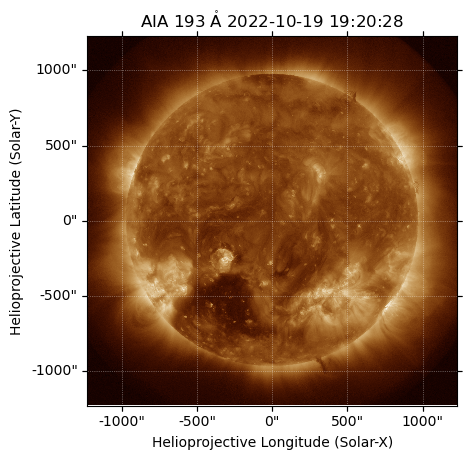

In [38]:
aia_193_map = sunpy.map.Map('../../src/AIA/20221019/193/lvl15/aia.lev1_euv_12s.2022-10-19T192027Z.193.image.fits')
aia_193_map.plot()

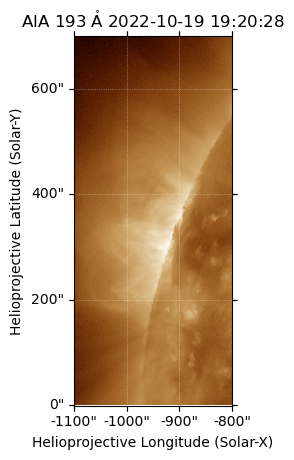

In [39]:
aia_193_map_crop = aia_193_map.submap(SkyCoord(-1100*u.arcsec,0*u.arcsec,frame=aia_193_map.coordinate_frame),
                                  top_right=SkyCoord(-800*u.arcsec,700*u.arcsec,frame=aia_193_map.coordinate_frame))

aia_193_map_crop.plot()

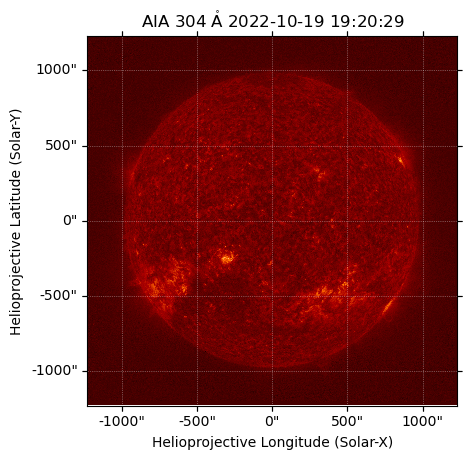

In [181]:
aia_304_map = sunpy.map.Map('../../src/AIA/20221019/304/lvl15/aia.lev1_euv_12s.2022-10-19T192027Z.304.image.fits')
aia_304_map.plot()

In [385]:
comp_1074_file = "../../src/UCoMP/20221019/20221019.ucomp.1074.l2.synoptic.median.fts"

In [388]:
with fits.open(comp_1074_file) as hdul:
    hdul.info()
    FeXIII_1074_enhanced_int = hdul[2].data.copy()
    # FeXIII_1074_peak_int = hdul[3].data.copy()
    # FeXIII_1074_vlos = hdul[4].data.copy()
    # FeXIII_1074_width = hdul[5].data.copy()

    comp_1074_header = hdul[0].header.copy()


Filename: ../../src/UCoMP/20221019/20221019.ucomp.1074.l2.synoptic.median.fts
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     201   ()      
  1  Center wavelength intensity    1 ImageHDU        19   (1280, 1024)   float32   
  2  Enhanced intensity    1 ImageHDU        19   (1280, 1024)   float32   
  3  Peak intensity    1 ImageHDU        18   (1280, 1024)   float32   
  4  LOS velocity    1 ImageHDU        21   (1280, 1024)   float32   
  5  Line width (FWHM)    1 ImageHDU        18   (1280, 1024)   float32   
  6  Noise mask    1 ImageHDU        18   (1280, 1024)   float32   
  7  Weighted average I    1 ImageHDU        18   (1280, 1024)   float32   
  8  Weighted average Q    1 ImageHDU        18   (1280, 1024)   float32   
  9  Weighted average U    1 ImageHDU        18   (1280, 1024)   float32   
 10  Weighted average L    1 ImageHDU        18   (1280, 1024)   float32   
 11  Azimuth       1 ImageHDU        18   (1280, 1024)   fl

In [389]:
ucomp_1074_enhanced_int_map = sunpy.map.Map(np.power(np.nan_to_num(FeXIII_1074_enhanced_int,nan=0.),0.7), comp_1074_header)
ucomp_1074_enhanced_int_map.plot_settings['norm'] = ImageNormalize(vmin=0, vmax=13.2)
ucomp_1074_enhanced_int_map.plot_settings['cmap'] = "Greys_r"

/tmp/ipykernel_4007964/2968956280.py:1: RuntimeWarning: invalid value encountered in power
  ucomp_1074_enhanced_int_map = sunpy.map.Map(np.power(np.nan_to_num(FeXIII_1074_enhanced_int,nan=0.),0.7), comp_1074_header)


In [390]:
ucomp_1074_enhanced_int_map_crop = ucomp_1074_enhanced_int_map.submap(SkyCoord(-1200*u.arcsec,0*u.arcsec,frame=ucomp_1074_enhanced_int_map.coordinate_frame), 
                                    top_right=SkyCoord(-800*u.arcsec,700*u.arcsec,frame=ucomp_1074_enhanced_int_map.coordinate_frame))

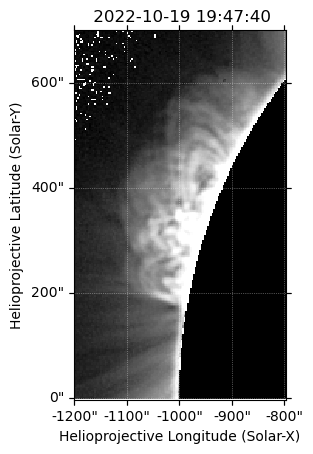

In [391]:
ucomp_1074_enhanced_int_map_crop.plot()

In [119]:
hmi_blos_map_1019 = sunpy.map.Map('../../src/HMI/20221019/hmi.M_45s.20221019_192100_TAI.2.magnetogram.fits')
hmi_blos_map_1019_toaia = hmi_blos_map_1019.reproject_to(aia_193_map_crop.wcs)
hmi_blos_map_1019_toaia.plot_settings['cmap'] = "Greys_r"
hmi_blos_map_1019_toaia.plot_settings['norm'] = ImageNormalize(vmin=-100,vmax=100)

In [40]:
eis_hhflare_195_fitres = eispac.read_fit("../../src/EIS/HH_Flare/20221019T1826/fitres/eis_20221019_191440.fe_12_195_119.1c-0.fit.h5")
eis_hhflare_195_intmap = eis_hhflare_195_fitres.get_map(component=0, measurement="intensity")
eis_hhflare_195_velmap = eis_hhflare_195_fitres.get_map(component=0, measurement="vel", )

Reading fit result from, 
   ../../src/EIS/HH_Flare/20221019T1826/fitres/eis_20221019_191440.fe_12_195_119.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


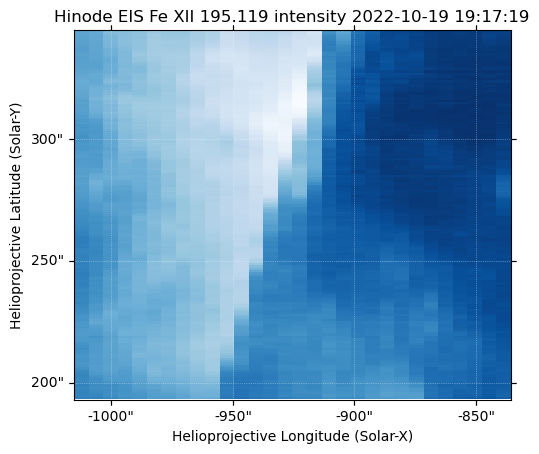

In [41]:
eis_hhflare_195_intmap.plot()

In [42]:
aia_resample_nx = (aia_193_map_crop.scale.axis1 * aia_193_map_crop.dimensions.x) / eis_hhflare_195_intmap.scale.axis1
aia_resample_ny = (aia_193_map_crop.scale.axis2 * aia_193_map_crop.dimensions.y) / eis_hhflare_195_intmap.scale.axis2
aia_193_map_crop_resample = aia_193_map_crop.resample(u.Quantity([aia_resample_nx, aia_resample_ny]))

In [43]:
Txshift_eis_hhflare_to_aia, Tyshift_eis_hhflare_to_aia = coalign_shift(aia_193_map_crop_resample,eis_hhflare_195_intmap)
print(Txshift_eis_hhflare_to_aia,Tyshift_eis_hhflare_to_aia)

4.25732 arcsec -5.99922 arcsec


In [44]:
eis_hhflare_195_intmap_shift = eis_hhflare_195_intmap.shift_reference_coord(Txshift_eis_hhflare_to_aia,Tyshift_eis_hhflare_to_aia)
eis_hhflare_195_velmap_shift = eis_hhflare_195_velmap.shift_reference_coord(Txshift_eis_hhflare_to_aia,Tyshift_eis_hhflare_to_aia)

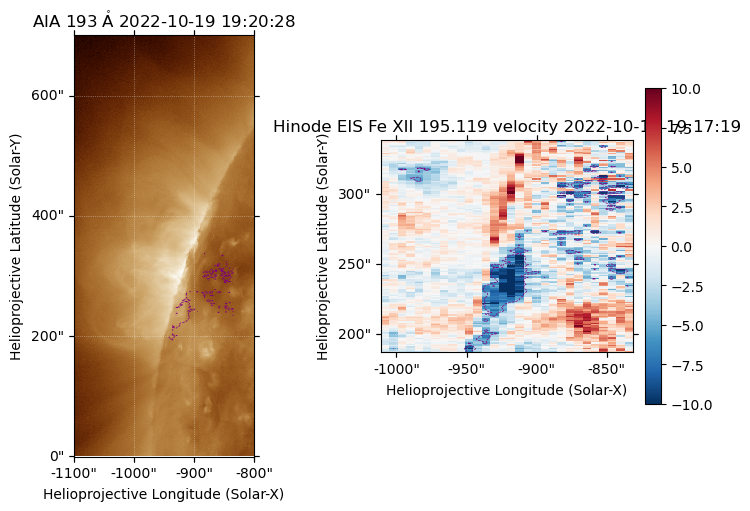

In [393]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(131,projection=aia_193_map_crop)
im1 = aia_193_map_crop.plot(axes=ax1)

ax2 = fig.add_subplot(132,projection=eis_hhflare_195_velmap_shift)
im2 = eis_hhflare_195_velmap_shift.plot(axes=ax2)
plt.colorbar(im2,ax=ax2,shrink=0.75)

levels = [-5]*u.km/u.s
for ax_ in [ax1,ax2]:
    eis_hhflare_195_velmap_shift.draw_contours(levels,axes=ax_,colors='purple',linewidths=0.5)

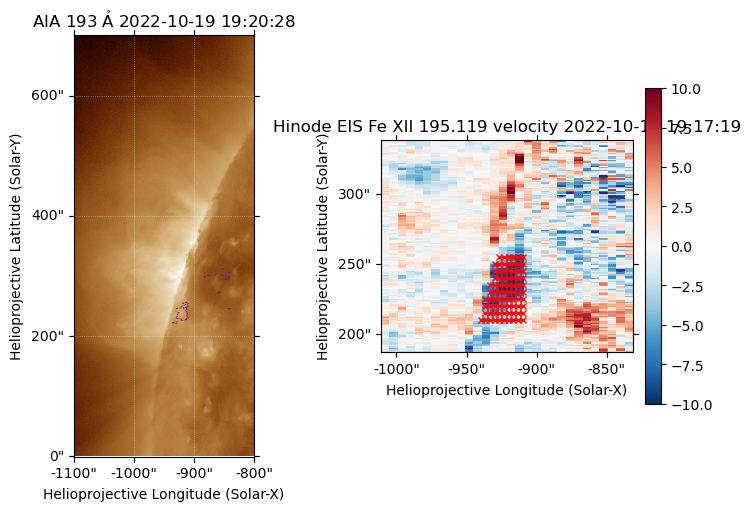

In [342]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(131,projection=aia_193_map_crop)
im1 = aia_193_map_crop.plot(axes=ax1)

ax2 = fig.add_subplot(132,projection=eis_hhflare_195_velmap_shift)
im2 = eis_hhflare_195_velmap_shift.plot(axes=ax2)
plt.colorbar(im2,ax=ax2,shrink=0.75)

levels = [-8]*u.km/u.s
for ax_ in [ax1,ax2]:
    eis_hhflare_195_velmap_shift.draw_contours(levels,axes=ax_,colors='purple',linewidths=0.5)

seed_0_lon, seed_0_lat = np.meshgrid(np.linspace(-940,-910,10), np.linspace(210,255,10))
seed_0 = SkyCoord(seed_0_lon.ravel()*u.arcsec,seed_0_lat.ravel()*u.arcsec,frame=aia_193_map_crop.coordinate_frame)

# seed_0 = SkyCoord(-920*u.arcsec,240*u.arcsec,frame=aia_193_map_crop.coordinate_frame)
ax2.plot_coord(seed_0,marker='x',color='red',markersize=5)

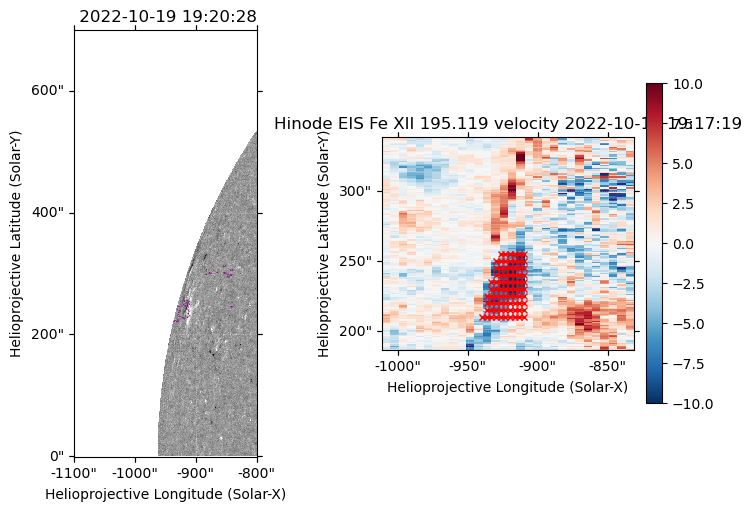

In [343]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(131,projection=aia_193_map_crop)
im1 =  hmi_blos_map_1019_toaia.plot(axes=ax1)

ax2 = fig.add_subplot(132,projection=eis_hhflare_195_velmap_shift)
im2 = eis_hhflare_195_velmap_shift.plot(axes=ax2)
plt.colorbar(im2,ax=ax2,shrink=0.75)

levels = [-8]*u.km/u.s
for ax_ in [ax1,ax2]:
    eis_hhflare_195_velmap_shift.draw_contours(levels,axes=ax_,colors='purple',linewidths=0.5)

ax2.plot_coord(seed_0,marker='x',color='red',markersize=5)

In [46]:
hmi_blos_map = sunpy.map.Map("../../src/HMI/20221022/lvl1/hmi.m_45s.2022.10.22_19_21_45_TAI.magnetogram.fits")

In [47]:
hmi_syn_shape_out=[540, 1080]
hmi_syn_frame_out = SkyCoord(0, 0, unit=u.deg, rsun=hmi_blos_map.coordinate_frame.rsun, frame="heliographic_stonyhurst", obstime=hmi_blos_map.date)
hmi_syn_header = sunpy.map.make_fitswcs_header(
    hmi_syn_shape_out,
    hmi_syn_frame_out,
    scale=[180 / hmi_syn_shape_out[0], 360 / hmi_syn_shape_out[1]] * u.deg / u.pix,
    projection_code="CAR",
)
hmi_syn_out_wcs = astropy.wcs.WCS(hmi_syn_header)

In [315]:
hmi_syn_shape_out=[540, 1080]
hmi_syn_frame_out = SkyCoord(0, 0, unit=u.deg, rsun=hmi_blos_map.coordinate_frame.rsun, frame="heliographic_stonyhurst", obstime=aia_193_map_crop.date)
hmi_syn_header = sunpy.map.make_fitswcs_header(
    hmi_syn_shape_out,
    hmi_syn_frame_out,
    scale=[180 / hmi_syn_shape_out[0], 360 / hmi_syn_shape_out[1]] * u.deg / u.pix,
    projection_code="CAR",
)
hmi_syn_out_wcs = astropy.wcs.WCS(hmi_syn_header)

In [316]:
with propagate_with_solar_surface():
    hmi_syn_array, _ = reproject_interp(hmi_blos_map, hmi_syn_out_wcs, shape_out=hmi_syn_shape_out)
hmi_syn_array = np.where(np.isnan(hmi_syn_array), 0, hmi_syn_array)

In [317]:
hmi_syn_cea_map = pfsspy.utils.car_to_cea(sunpy.map.Map(hmi_syn_array, hmi_syn_header))
hmi_syn_cea_map.meta['TELESCOP'] = hmi_blos_map.meta['TELESCOP']
hmi_syn_cea_map.meta['CONTENT'] = 'Carrington Synoptic Chart Of Br Field'
hmi_syn_cea_map.meta['T_OBS'] = hmi_syn_cea_map.meta.pop('DATE-OBS')

In [318]:
hmi_syn_cea_map = sunpy.map.Map(hmi_syn_cea_map.data, hmi_syn_cea_map.meta,)
hmi_syn_cea_map.plot_settings['cmap'] = 'hmimag'
hmi_syn_cea_map.plot_settings['norm'] = ImageNormalize(vmin=-1500,vmax=1500)

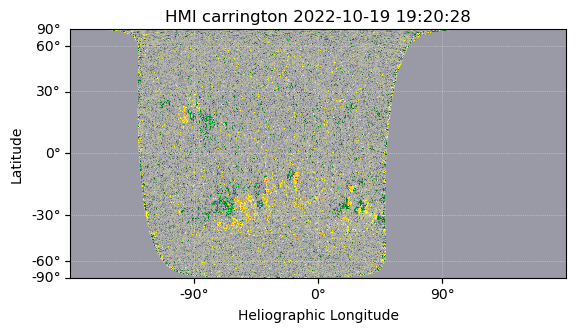

In [319]:
hmi_syn_cea_map.plot()

In [60]:
hmi_syn_cr2263_map = sunpy.map.Map("../../src/HMI/CR2263/hmi.synoptic_mr_polfil_720s.2263.Mr_polfil.fits")

In [62]:
hmi_syn_cr2263_map_resample = hmi_syn_cr2263_map.resample([720,1800]*u.pix)

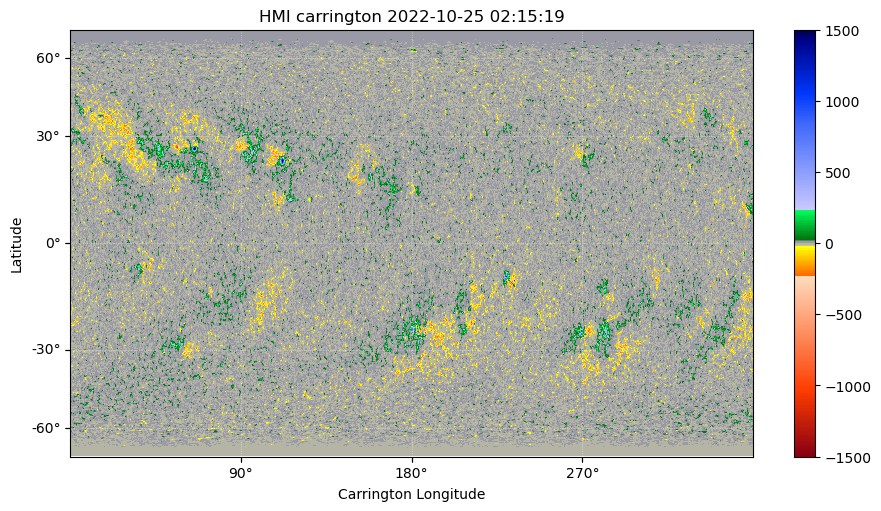

In [107]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=hmi_syn_cr2263_map_resample)
hmi_syn_cr2263_map_resample.plot(axes=ax,aspect=1/4)
plt.colorbar(ax=ax)


In [263]:
hmi_syn_cr2263_map_resample_new = deepcopy(hmi_syn_cr2263_map_resample)
hmi_syn_cr2263_map_resample_new.meta["t_obs"] = aia_193_map_crop.meta["t_obs"]
hmi_syn_cr2263_map_resample_new = sunpy.map.Map(hmi_syn_cr2263_map_resample_new.data,hmi_syn_cr2263_map_resample_new.meta)

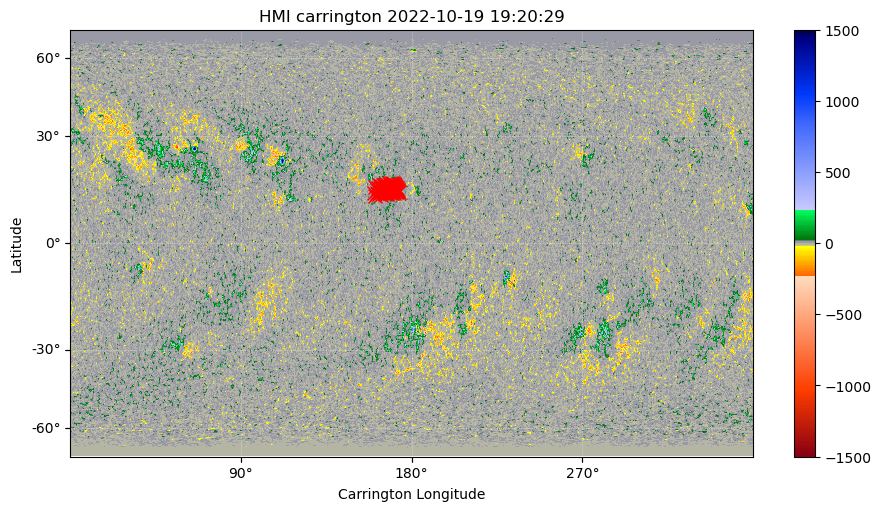

In [344]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=hmi_syn_cr2263_map_resample_new)
hmi_syn_cr2263_map_resample_new.plot(axes=ax,aspect=1/4)
plt.colorbar(ax=ax)
ax.plot_coord(seed_0,marker='x',color='red',markersize=10)

In [64]:
nrho = 70
rss = 2.5
pfss_input = pfsspy.Input(hmi_syn_cr2263_map_resample, nrho, rss)
pfss_output = pfsspy.pfss(pfss_input)

In [99]:
pfss_input.map.plot_settings["vmin"]=-1500
pfss_input.map.plot_settings["vmax"]=1500
pfss_input.map.plot_settings["norm"] = ImageNormalize(vmin=-1500,vmax=1500)

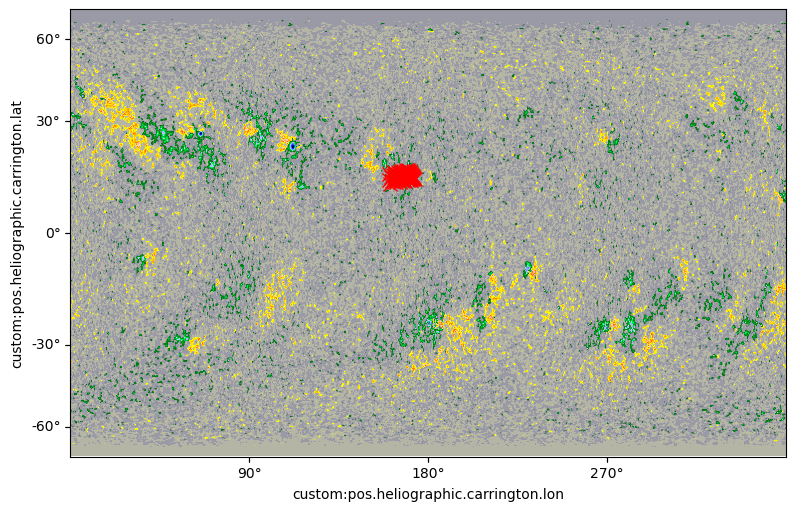

In [394]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=pfss_input.map)
ax.imshow(pfss_input.map.data,origin='lower',cmap='hmimag',norm=ImageNormalize(vmin=-1500,vmax=1500),aspect=1/4)
with propagate_with_solar_surface():
    ax.plot_coord(seed_0,marker='x',color='red',markersize=10)


In [345]:
tracer_0 = tracing.FortranTracer()
with propagate_with_solar_surface():
    flines_0 = tracer_0.trace(seed_0, pfss_output)

/home/yjzhu/anaconda3/envs/sunpy/lib/python3.11/site-packages/pfsspy/tracing.py:180: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(


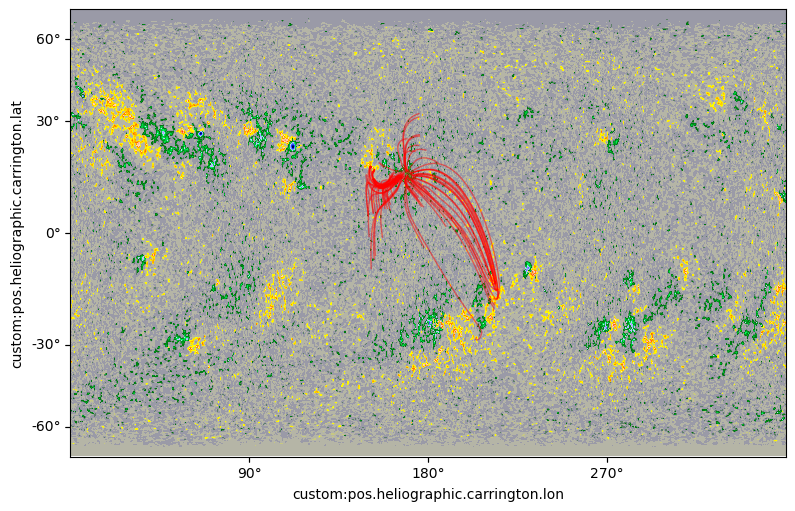

In [354]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=pfss_input.map)
ax.imshow(pfss_input.map.data,origin='lower',cmap='hmimag',norm=ImageNormalize(vmin=-1500,vmax=1500),aspect=1/4)

with propagate_with_solar_surface():
    for fline in flines_0:
        if get_loop_length(fline) > 100 * u.Mm:
            ax.plot_coord(fline.coords, color='red', linewidth=1,alpha=0.5)

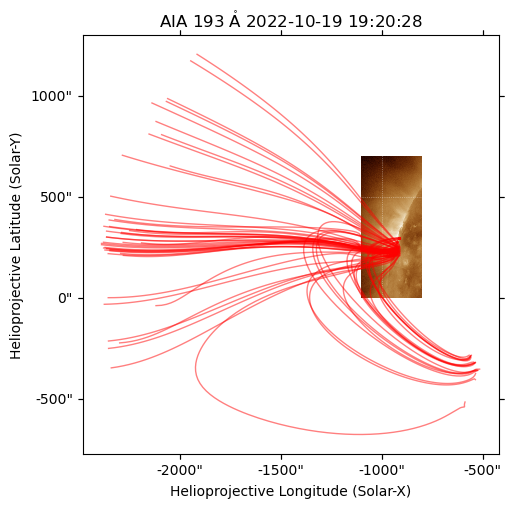

In [355]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=aia_193_map_crop)
aia_193_map_crop.plot(axes=ax)

with propagate_with_solar_surface():
    for fline in flines_0:
        if get_loop_length(fline) > 100 * u.Mm:
            ax.plot_coord(fline.coords, color='red', linewidth=1,alpha=0.5)

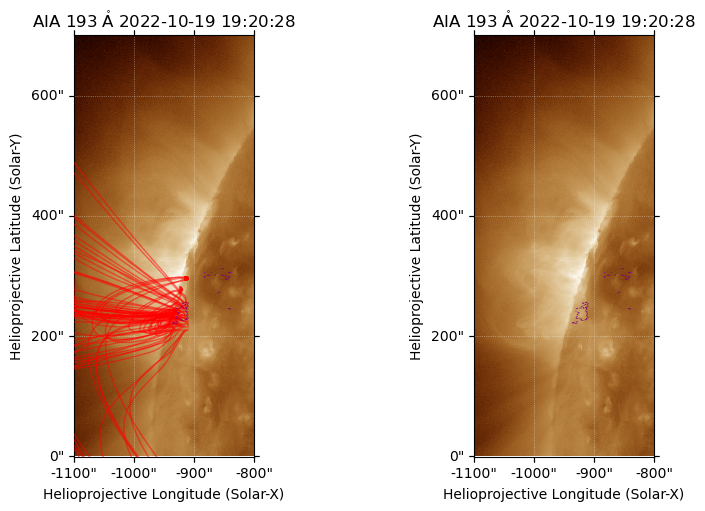

In [366]:
fig = plt.figure(figsize=(8,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_193_map_crop)
aia_193_map_crop.plot(axes=ax1)

bounds = ax1.axis()
with propagate_with_solar_surface():
    for fline in flines_0:
        if get_loop_length(fline) > 100 * u.Mm:
            ax1.plot_coord(fline.coords, color='red', linewidth=1,alpha=0.5)
ax1.axis(bounds)

ax2 = fig.add_subplot(122,projection=aia_193_map_crop)
aia_193_map_crop.plot(axes=ax2)

for ax_ in (ax1,ax2):
    eis_hhflare_195_velmap_shift.draw_contours(levels,axes=ax_,colors='purple',linewidths=0.5)

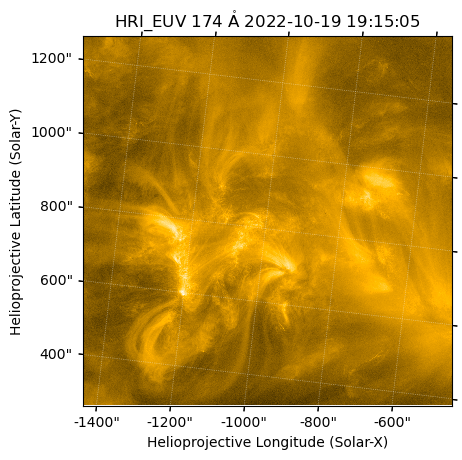

In [143]:
hri_174_map = sunpy.map.Map("../../src/EUI/HRI/euv174/20221019/solo_L2_eui-hrieuv174-image_20221019T191505160_V01.fits")
hri_174_map.plot()

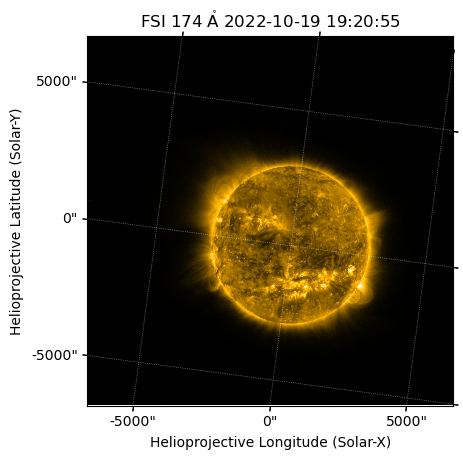

In [144]:
fsi_174_map = sunpy.map.Map("../../src/EUI/FSI/euv174/20221019/solo_L2_eui-fsi174-image_20221019T192050291_V01.fits")
fsi_174_map.plot()

In [146]:
fsi_174_map_hri_time = derotate_fsi(fsi_174_map,hri_174_map)

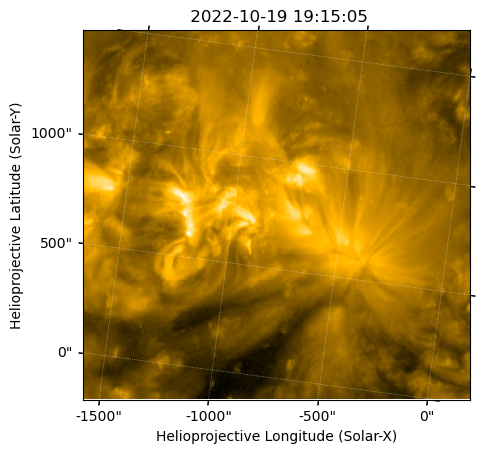

In [154]:
fsi_174_crop = fsi_174_map_hri_time.submap(SkyCoord(-1600*u.arcsec,0*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame),
                                    top_right=SkyCoord(0*u.arcsec,1500*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame))
fsi_174_crop.plot() 

In [149]:
hri_174_map_rotate_to_fsi_wcs = deepcopy(hri_174_map.wcs)
hri_174_map_rotate_to_fsi_wcs.wcs.pc = fsi_174_map_hri_time.wcs.wcs.pc
hri_174_map_rotate_to_fsi_wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'HPLN-TAN' 'HPLT-TAN' 
CRVAL : -0.29328245342933 0.21756333842325 
CRPIX : 896.5 960.5 
PC1_1 PC1_2  : 0.99125705720255 -0.13194486176485 
PC2_1 PC2_2  : 0.13194486176485 0.99125705720255 
CDELT : 0.00013666666666667 0.00013666666666667 
NAXIS : 2048  2048

In [151]:
hri_174_map_correct_rot_matrix = hri_174_map.reproject_to(hri_174_map_rotate_to_fsi_wcs)

In [167]:
hri_174_map_repro = hri_174_map_correct_rot_matrix.reproject_to(fsi_174_crop.wcs)

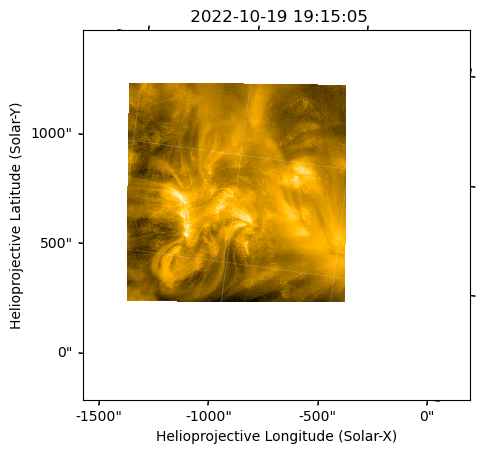

In [168]:
hri_174_map_repro.plot()

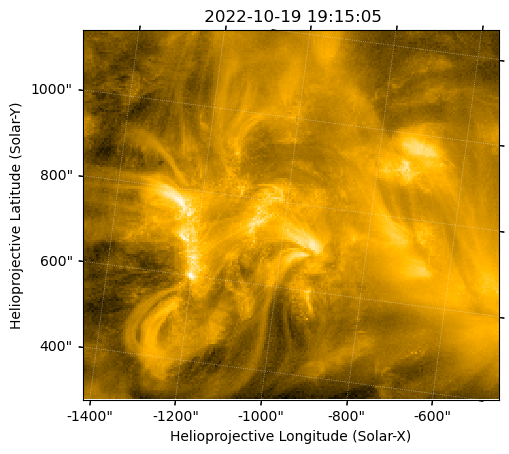

In [169]:
hri_174_map_repro_cut = hri_174_map_repro.submap([50,105]*u.pix,
                                                 top_right=[270,300]*u.pix)
hri_174_map_repro_cut.plot()

In [170]:
Txshift_hri, Tyshift_hri = coalign_shift(fsi_174_crop,hri_174_map_repro_cut)
print(Txshift_hri, Tyshift_hri)

11.4204 arcsec 5.90458 arcsec


In [171]:
hri_174_map_repro_shift = hri_174_map_repro.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_repro_cut_shift = hri_174_map_repro_cut.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_shifted = hri_174_map_correct_rot_matrix.shift_reference_coord(Txshift_hri,Tyshift_hri)
fsi_174_hri_fov = fsi_174_map_hri_time.reproject_to(hri_174_map_shifted.wcs)

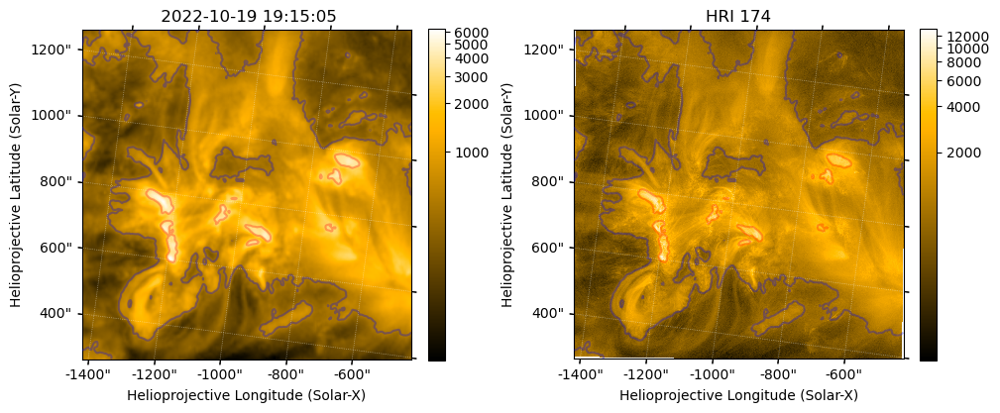

In [172]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_hri_fov)
im1 = fsi_174_hri_fov.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
ax2.set_title("HRI 174")
plt.colorbar(ax=ax2,shrink=0.75)

fsi_174_levels = [500,3000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_174_hri_fov.draw_contours(fsi_174_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

In [173]:
SunBlinker(fsi_174_hri_fov, hri_174_map_shifted,figsize=(5,5))

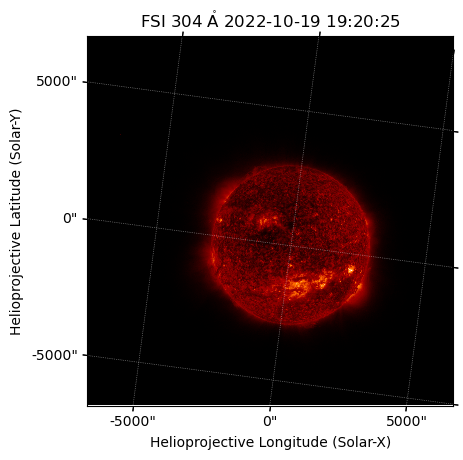

In [176]:
fsi_304_map = sunpy.map.Map("../../src/EUI/FSI/euv304/20221019/solo_L2_eui-fsi304-image_20221019T192020291_V01.fits")
fsi_304_map.plot()

In [177]:
fsi_304_map_hri_time = derotate_fsi(fsi_304_map,hri_174_map)

In [178]:
fsi_304_crop = fsi_304_map_hri_time.submap(SkyCoord(-1600*u.arcsec,0*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame),
                                    top_right=SkyCoord(0*u.arcsec,1500*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame))

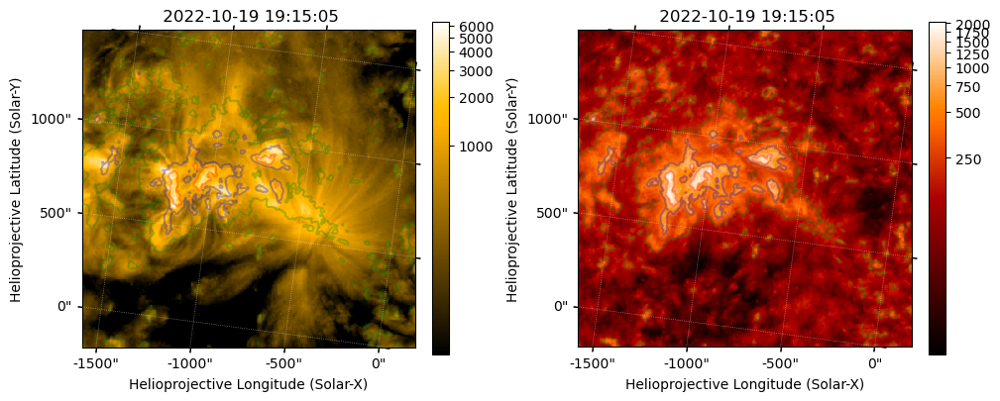

In [179]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_crop)
im1 = fsi_174_crop.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [180]:
SunBlinker(fsi_174_crop, fsi_304_crop)

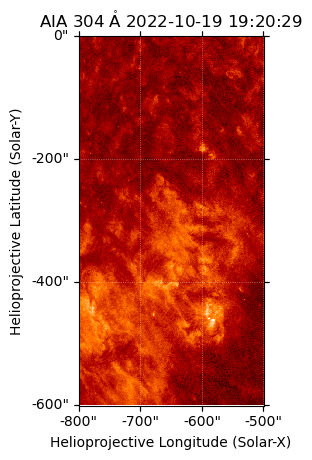

In [193]:
aia_304_coalign_crop = aia_304_map.submap(SkyCoord(-800*u.arcsec,-600*u.arcsec,frame=aia_304_map.coordinate_frame),
                                    top_right=SkyCoord(-500*u.arcsec,0*u.arcsec,frame=aia_304_map.coordinate_frame))

aia_304_coalign_crop.plot()

In [216]:
Txshift_apply_to_original_fsi, Tyshift_apply_to_original_fsi = -24*u.arcsec,-10.05*u.arcsec
fsi_304_map_adjust = fsi_304_map_hri_time.shift_reference_coord(Txshift_apply_to_original_fsi,Tyshift_apply_to_original_fsi)
fsi_304_map_repro = fsi_304_map_adjust.reproject_to(aia_304_coalign_crop.wcs)
fsi_304_map_repro_cut = fsi_304_map_repro.submap([10,100]*u.pix,
                                                 top_right=[1000,500]*u.pix)
# fsi_304_map_repro_cut.plot()
Txshift_fsi_aia304, Tyshift_fsi_aia304 = coalign_shift(aia_304_coalign_crop,fsi_304_map_repro_cut)
print(Txshift_fsi_aia304, Tyshift_fsi_aia304)

0 arcsec -0.00416355 arcsec


In [217]:
hri_174_map_shifted_shifted_to_aia = hri_174_map_shifted.shift_reference_coord(Txshift_apply_to_original_fsi, Tyshift_apply_to_original_fsi)

(-0.5, 2047.5, -0.5, 2047.5)

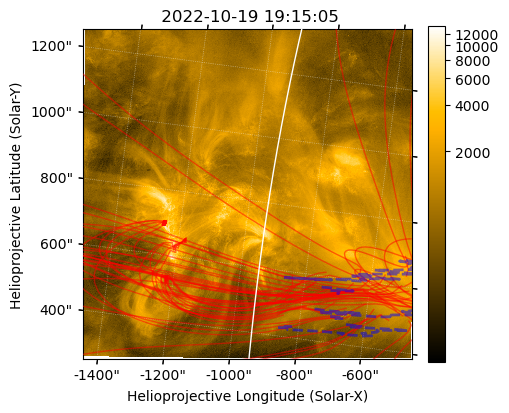

In [398]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=hri_174_map_shifted_shifted_to_aia)
hri_174_map_shifted_shifted_to_aia.plot()
plt.colorbar(ax=ax,shrink=0.75)

bounds = ax.axis()
with propagate_with_solar_surface():
    for fline in flines_0:
        if get_loop_length(fline) > 100 * u.Mm:
            ax.plot_coord(fline.coords, color='red', linewidth=1,alpha=0.5)

    levels = [-5]*u.km/u.s  
    eis_hhflare_195_velmap_shift.draw_contours(levels,axes=ax,colors='blue',linewidths=2,alpha=0.5)
    aia_193_map.draw_limb(axes=ax)
ax.axis(bounds)



In [272]:
seeds_test_eui_lon, seeds_test_eui_lat = np.meshgrid(np.linspace(-1400,-600,20),np.linspace(400,1200,20))
seeds_test_eui = SkyCoord(seeds_test_eui_lon.ravel()*u.arcsec,seeds_test_eui_lat.ravel()*u.arcsec,
                          frame=hri_174_map_shifted_shifted_to_aia.coordinate_frame)


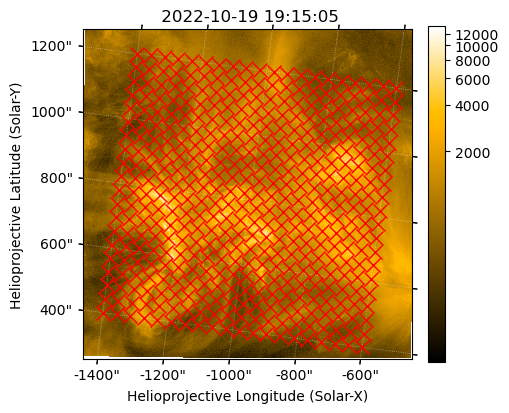

In [273]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=hri_174_map_shifted_shifted_to_aia)
hri_174_map_shifted_shifted_to_aia.plot()
plt.colorbar(ax=ax,shrink=0.75)

ax.plot_coord(seeds_test_eui,marker='x',color='red',markersize=10,linewidth=0)

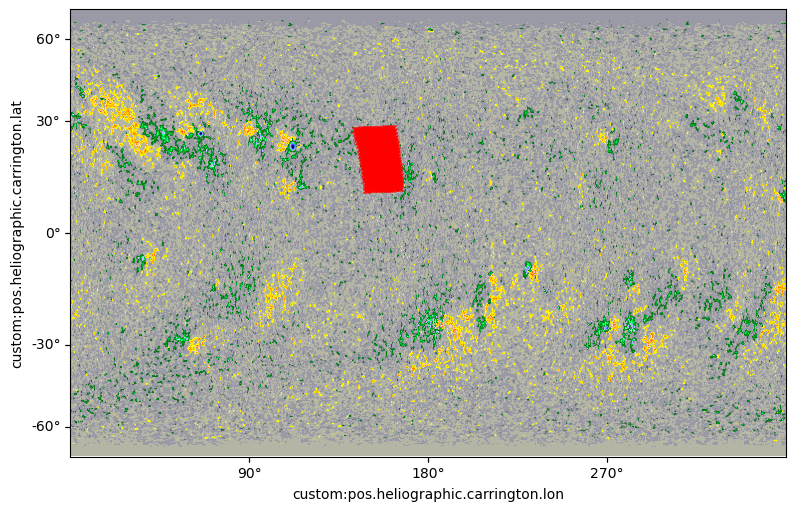

In [274]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=pfss_input.map)
ax.imshow(pfss_input.map.data,origin='lower',cmap='hmimag',norm=ImageNormalize(vmin=-1500,vmax=1500),aspect=1/4)
with propagate_with_solar_surface():
    ax.plot_coord(seeds_test_eui,marker='x',color='red',markersize=5,linewidth=0)


In [275]:
tracer_eui_test = tracing.FortranTracer()
with propagate_with_solar_surface():
    flines_eui_test = tracer_eui_test.trace(seeds_test_eui, pfss_output)

/home/yjzhu/anaconda3/envs/sunpy/lib/python3.11/site-packages/pfsspy/tracing.py:180: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(


(-0.5, 2047.5, -0.5, 2047.5)

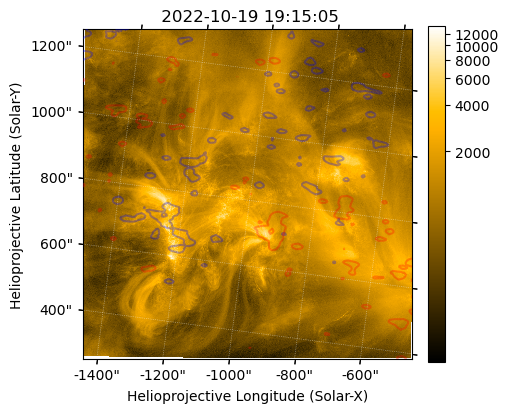

In [276]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=hri_174_map_shifted_shifted_to_aia)
hri_174_map_shifted_shifted_to_aia.plot()
plt.colorbar(ax=ax,shrink=0.75)

bounds = ax.axis()
hmi_levels = [-100,100]*pfss_input.map.unit
with propagate_with_solar_surface():
    pfss_input.map.draw_contours(hmi_levels,colors=["b","r"], axes=ax, alpha=0.3)
ax.axis(bounds)

In [331]:
with propagate_with_solar_surface():
    pfss_input_map_repro_to_fsi = pfss_input.map.reproject_to(fsi_304_map_adjust.wcs)

In [333]:
pfss_input_map_repro_to_fsi_crop = pfss_input_map_repro_to_fsi.submap(SkyCoord(-1600*u.arcsec,0*u.arcsec,frame=pfss_input_map_repro_to_fsi.coordinate_frame),
                                    top_right=SkyCoord(0*u.arcsec,1500*u.arcsec,frame=pfss_input_map_repro_to_fsi.coordinate_frame))

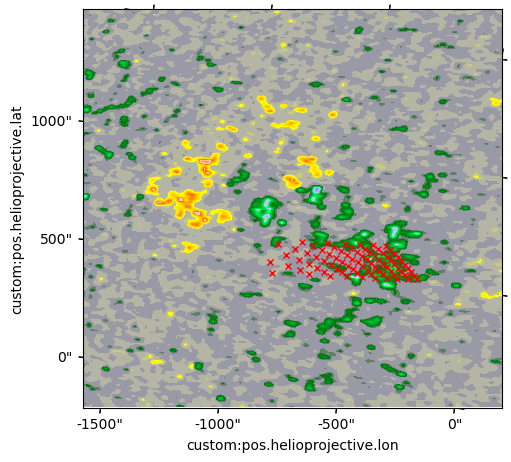

In [360]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=pfss_input_map_repro_to_fsi_crop)
ax.imshow(pfss_input_map_repro_to_fsi_crop.data,origin='lower',cmap='hmimag',norm=ImageNormalize(vmin=-1500,vmax=1500))
ax.plot_coord(seed_0,marker='x',color='red',markersize=5,linewidth=0)

(-0.5, 2047.5, -0.5, 2047.5)

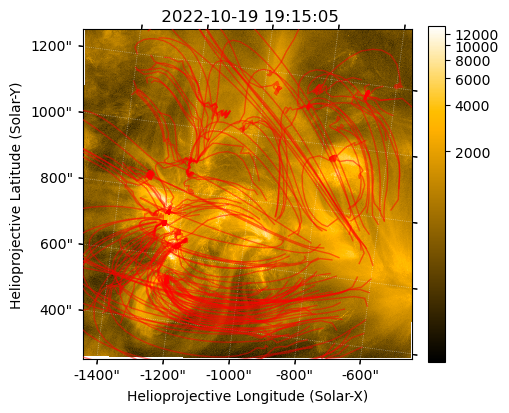

In [278]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=hri_174_map_shifted_shifted_to_aia)
hri_174_map_shifted_shifted_to_aia.plot()
plt.colorbar(ax=ax,shrink=0.75)

bounds = ax.axis()
with propagate_with_solar_surface():
    for fline in flines_eui_test:
        if get_loop_length(fline) > 100 * u.Mm:
            ax.plot_coord(fline.coords, color='red', linewidth=1,alpha=0.5)

ax.axis(bounds)

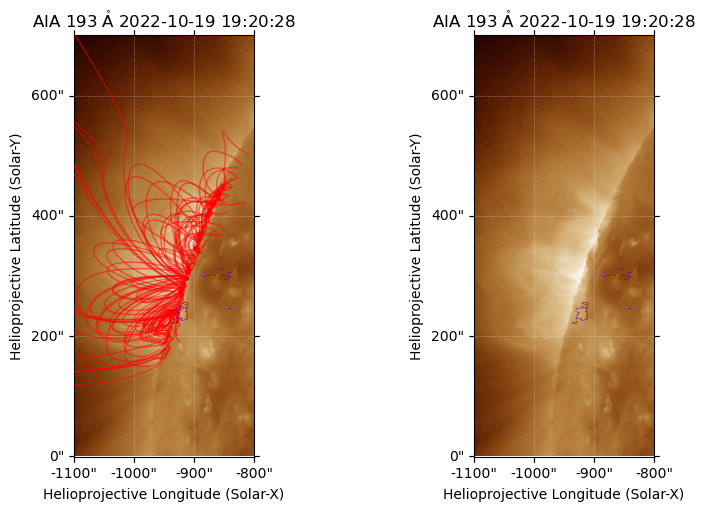

In [392]:
fig = plt.figure(figsize=(8,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_193_map_crop)
aia_193_map_crop.plot(axes=ax1)

bounds = ax1.axis()
with propagate_with_solar_surface():
    for fline in flines_eui_test:
        if get_loop_length(fline) > 100 * u.Mm:
            ax1.plot_coord(fline.coords, color='red', linewidth=1,alpha=0.5)
ax1.axis(bounds)

ax2 = fig.add_subplot(122,projection=aia_193_map_crop)
aia_193_map_crop.plot(axes=ax2)

for ax_ in (ax1,ax2):
    eis_hhflare_195_velmap_shift.draw_contours(levels,axes=ax_,colors='purple',linewidths=0.5)

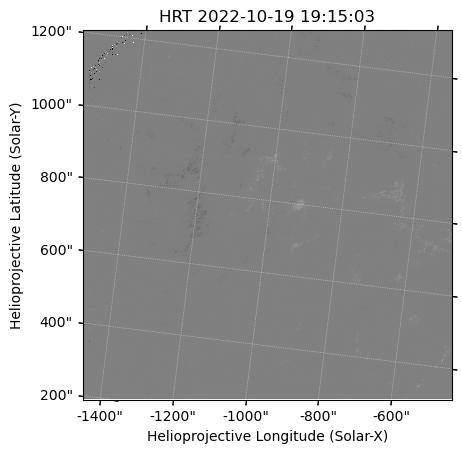

In [281]:
phi_blos_map = sunpy.map.Map("../../src/PHI/20221019/solo_L2_phi-hrt-blos_20221019T191503_V01.fits")
phi_blos_map.plot()

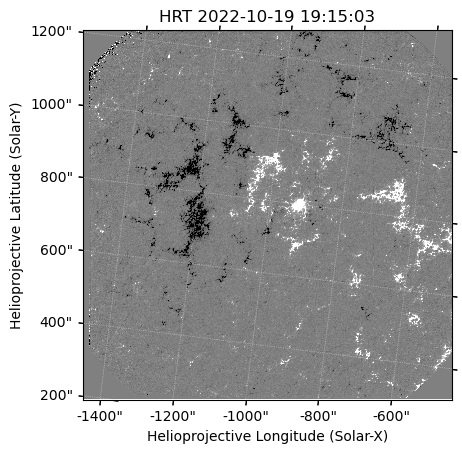

In [304]:
phi_blos_map_crop = phi_blos_map.submap([0,0]*u.pix,
                                        top_right=[2048,2048]*u.pix)
phi_blos_map_crop.plot(vmin=-200,vmax=200)

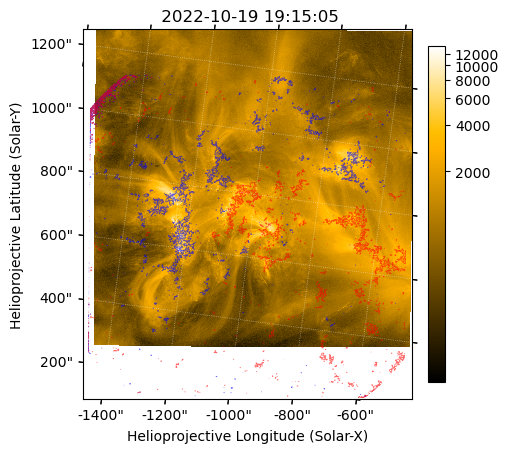

In [305]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=hri_174_map_shifted_shifted_to_aia)
hri_174_map_shifted_shifted_to_aia.plot()
plt.colorbar(ax=ax,shrink=0.75)

Txshift_hri_to_eui, Tyshift_hri_to_eui = -12*u.arcsec,-95*u.arcsec
bounds = ax.axis()
phi_blos_map_crop_shift = phi_blos_map_crop.shift_reference_coord(Txshift_hri_to_eui, Tyshift_hri_to_eui)
phi_blos_map_crop_shift.draw_contours([-100,100]*phi_blos_map_crop_shift.unit,
                                      axes=ax,colors=["b","r"],linewidths=0.5,alpha=0.6)


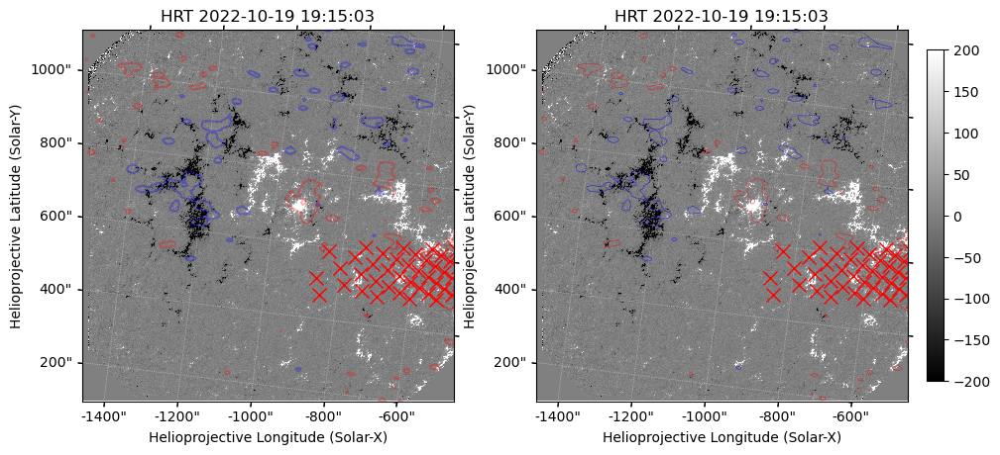

In [395]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_blos_map_crop_shift)
phi_blos_map_crop_shift.plot(axes=ax1,vmin=-200,vmax=200)

bounds = ax1.axis()
with propagate_with_solar_surface():
    pfss_input.map.draw_contours(hmi_levels,colors=["b","r"], axes=ax1, alpha=0.3)
ax1.axis(bounds)

ax2 = fig.add_subplot(122,projection=phi_blos_map_crop_shift)
phi_blos_map_crop_shift.plot(axes=ax2,vmin=-200,vmax=200)
plt.colorbar(ax=ax2,shrink=0.75)

bounds = ax2.axis()
hmi_syn_cr2263_map_resample_new.draw_contours([-100,100]*hmi_syn_cr2263_map_resample_new.unit,
                                              axes=ax2,colors=["b","r"],linewidths=0.5,alpha=0.6)
ax2.axis(bounds)

for ax_ in (ax1,ax2):
    ax_.plot_coord(seed_0,marker='x',color='red',markersize=10,linewidth=0)

(-0.5, 2047.5, -0.5, 2047.5)

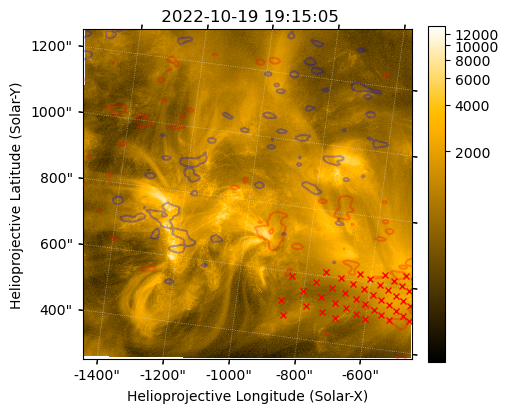

In [362]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=hri_174_map_shifted_shifted_to_aia)
hri_174_map_shifted_shifted_to_aia.plot()
plt.colorbar(ax=ax,shrink=0.75)

bounds = ax.axis()
with propagate_with_solar_surface():
    pfss_input.map.draw_contours(hmi_levels,colors=["b","r"], axes=ax, alpha=0.3)
    ax.plot_coord(seed_0,marker='x',color='red',markersize=5,linewidth=0)
ax.axis(bounds)

In [323]:
hmi_syn_cea_map_to_fsi = hmi_syn_cea_map.reproject_to(fsi_304_map_adjust.wcs)

In [327]:
hmi_syn_cea_map_to_fsi_crop = hmi_syn_cea_map_to_fsi.submap(SkyCoord(-1600*u.arcsec,0*u.arcsec,frame=hmi_syn_cea_map_to_fsi.coordinate_frame),
                                    top_right=SkyCoord(0*u.arcsec,1500*u.arcsec,frame=hmi_syn_cea_map_to_fsi.coordinate_frame))



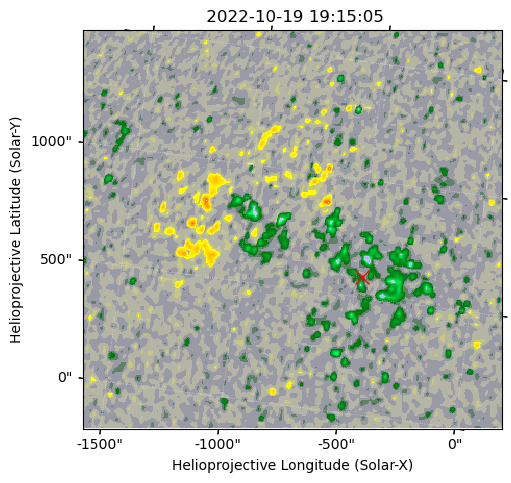

In [330]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=hmi_syn_cea_map_to_fsi_crop)
hmi_syn_cea_map_to_fsi_crop.plot(axes=ax)
ax.plot_coord(seed_0,marker='x',color='red',markersize=10,linewidth=0)

(-0.5, 2047.5, -0.5, 2047.5)

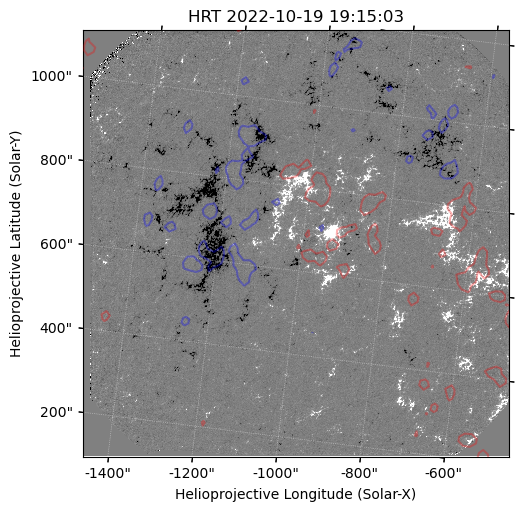

In [326]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_blos_map_crop_shift)
phi_blos_map_crop_shift.plot(axes=ax1,vmin=-200,vmax=200)

bounds = ax1.axis()
hmi_syn_cea_map.draw_contours([-50,50],colors=["b","r"], axes=ax1, alpha=0.3)
ax1.axis(bounds)